# Module 2 - Efficient LLM Fine Tuning

> **Introduction**

In this module, you will learn what fine-tuning is and why we do it. You will also learn how
we do fine-tuning in a parameter-efficient way and the limitations that come with that.
Lastly, since data power all LLMs, we will also talk about data preparation
best practices that you can take home with to fine-tune your own model.

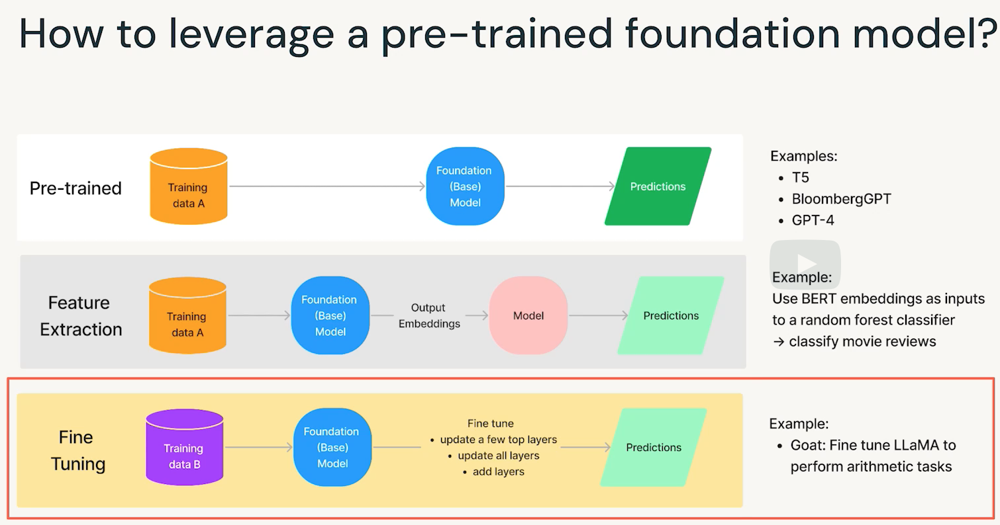

Fine-tuning means we are updating model weights or model parameters.
Usually, when we update more layers, we get better model performance. And typically when we do full
fine-tuning, which means when we are updating all the model weights, we produce one model per task.

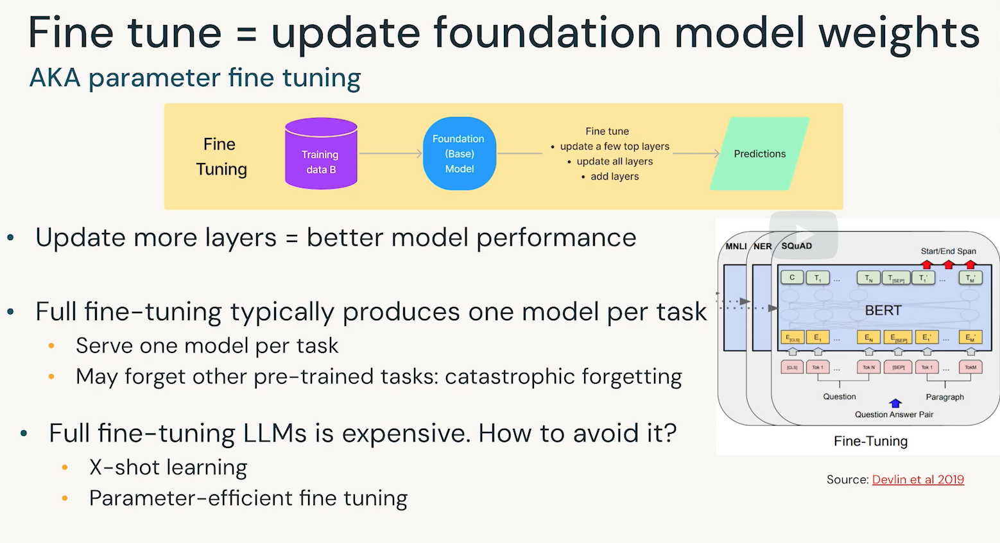

On the right image over here, you will see that we can fine-tune BERT on different data sets:
on SQUAD, which is a Q/A data set, a named entity recognition data set a multi-genre
natural language inference data set. Each of these fine-tuning processes
will give us a new model, so we serve one model per task at deployment time.
But this means that we need to deal with many copies of the same foundation model and this is
especially undesirable when our models these days are much bigger than this 110 million BERT model.
Disk space is cheap these days but some models like LaMDA, which is a family of
models specialized for dialogues, takes almost 500 GB of disk space. So another question is
that we need to consider at deployment time: do we have that many input requests for specific tasks?


Next, for full fine-tuning, it may also produce an undesirable consequence called
catastrophic forgetting, which is when the foundation model that we trained
or we leveraged before already forgot how to perform other pre-trained tasks.
So full fine-tuning is expensive. How do we avoid doing it? There are two methods:
one is few-shot learning; the other is parameter-efficient fine-tuning.
Before we go to parameter-efficient fine-tuning, which is what we often
abbreviate as PEFT, we'll briefly look at what few-shot learning is.

> **Few-Shot Learning**



Few-shot learning is when we provide several examples of new tasks in a text prompt. We
typically use this when we don't want to do fine-tuning or when we lack labeled training data,
but we can easily write out a few examples for the LLM to learn from. So this process of writing
out instructions in the form of text is called a prompt and we iteratively write different prompts
to find out the best prompt to pass to our LLMs. And this is a process called prompt engineering.

So this process of developing prompts can also be called as prompt design. And especially
important for this particular module, we will be referring to prompt engineering as hard prompt
tuning or discrete prompt tuning, so just know that whenever I refer to hard prompt
tuning or discrete prompt tuning, I'm really talking about few-shot learning.

The **main distinction that we should make between few-shot learning and fine-tuning
is few-shot learning doesn't update any model weights whereas fine-tuning updates model weights**.

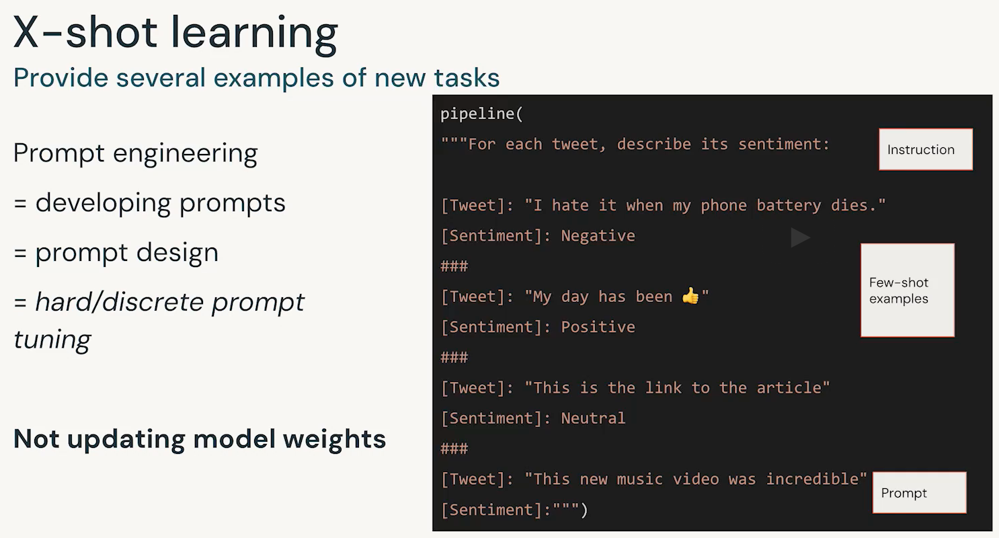

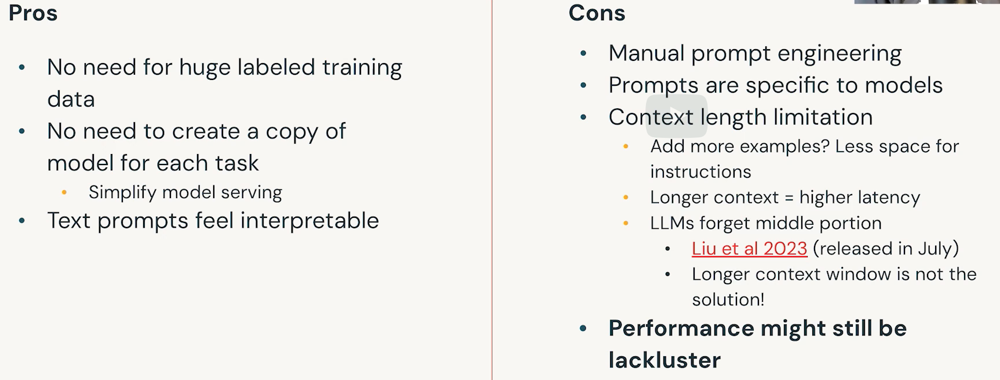

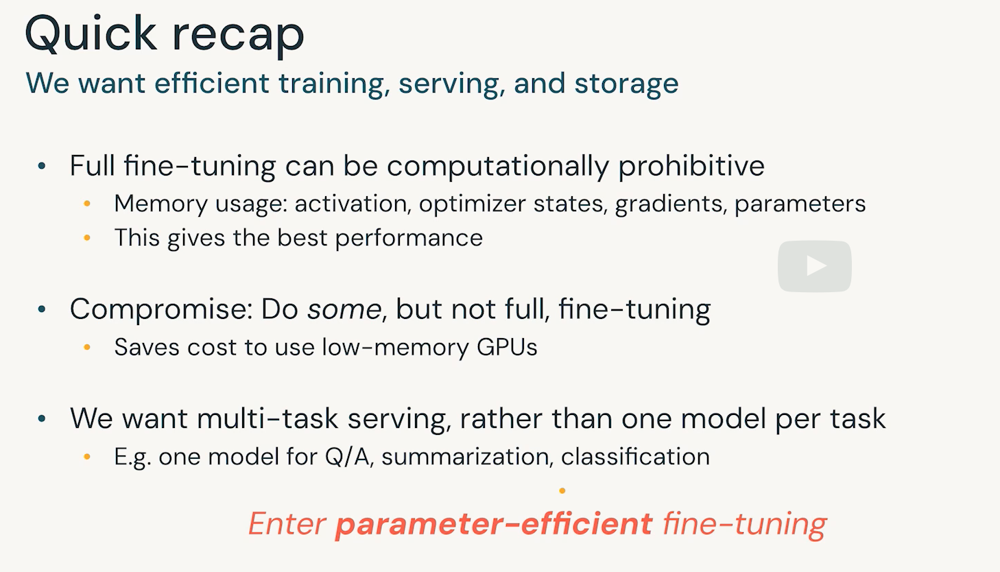

> **Parameter-Efficient Fine-Tuning (PEFT) & Soft Prompt**

There are three categories of PEFT, including additive, selective and re-parameterization.
In this course, we'll focus only on the first and the third category,
which is additive and also re-parameterization because the selective category is found to be
not as good as the other two. 

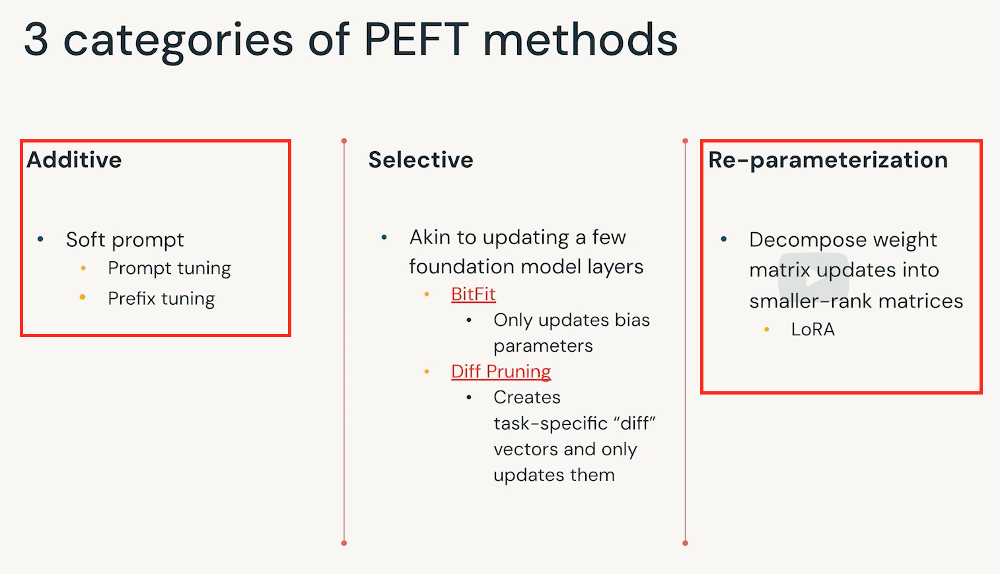


PEFT has been a very actively researched area. At its core: 
- Additive methods include adding new tunable layers to the model. And during fine-tuning process, we only update those new layer weights, while keeping the foundation model weights frozen.
- Re-parameterization involves decomposing a weight matrix into lower-rank matrices. 

Fundamentally, these methods act on the core Transformer block; some act specifically on the query, key, value weight matrices that are responsible for passing information.



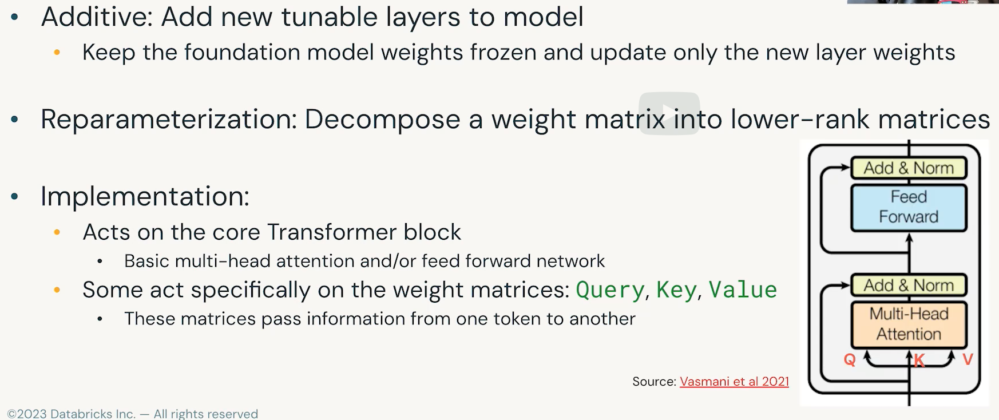

> **Soft Promt - Removing the Manual Prompting from the Quation**

The manual act of *writing text prompts is also called hard prompts or discrete prompts*. In this section, it
is all about how to remove that manual aspect of prompt engineering but use soft prompts instead. **Adding soft prompts means that we're adding virtual tokens to our inputs**.

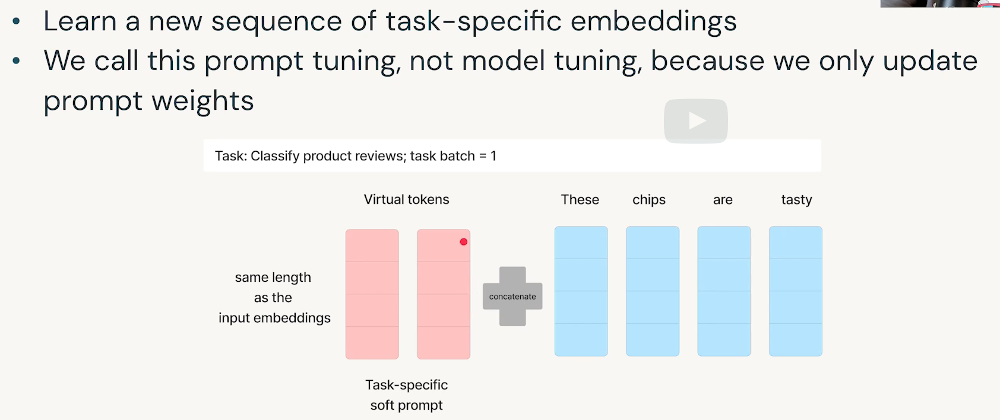

**What are virtual tokens?**

The challenging part with prompt engineering or writing discrete prompts was that it's very manual and very labor
intensive and very error-prone. So instead of relying on humans crafting a perfect prompt,
in soft prompt or virtual tokens, we let the model find the best prompt through fine-tuning.

We first randomly initialize an embedding vector that's just made up of random numbers
and this vector will have the same dimension as our input embeddings.
So these randomly initialized embedding vectors, since they are completely random,
so they are not part of any vocabulary, meaning that we don't know what text they correspond to.

But when we look at virtual tokens in an embedding space,
we know that it occupies somewhere in the embedding space but we don't know what text
it corresponds to. So it's a little bit like Bitcoin when we know that it functions like
money but we cannot touch it like cash; we don't even know how it looks but it exists and it works.

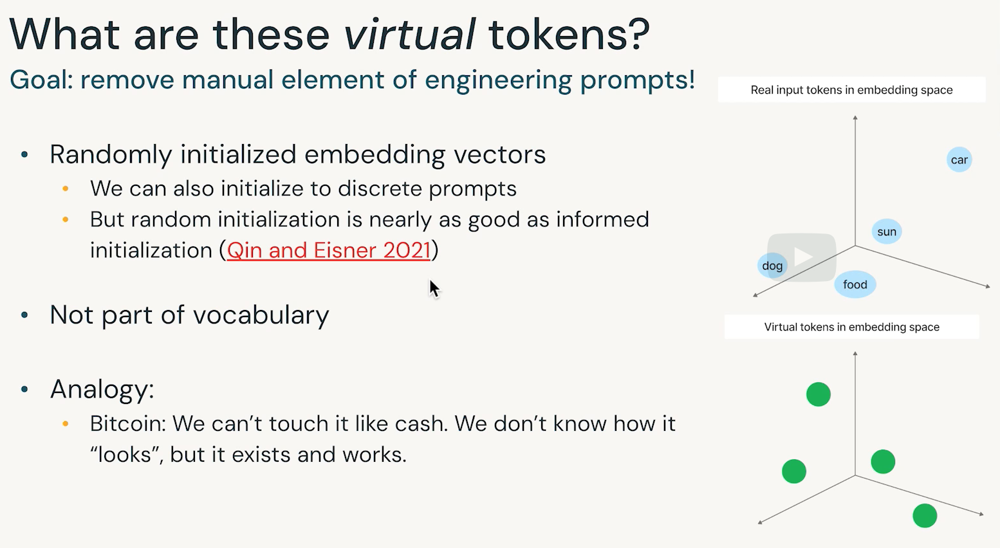


When we think about manual prompt engineering or discrete prompt writing,
which is when we supply just like in a few-shot learning example, where we supply some examples
and pass in as context to the LLM. That's **when we are searching the text space over
tokens with fixed embeddings but with prompt tuning, we are searching in the embedding
space to find the best representation of the prompt that the LLMs should accept**.
And the best thing out of this is **the model learns the optimal representation
of the prompt automatically, removing the manual labor of engineering a discrete prompt manually**.

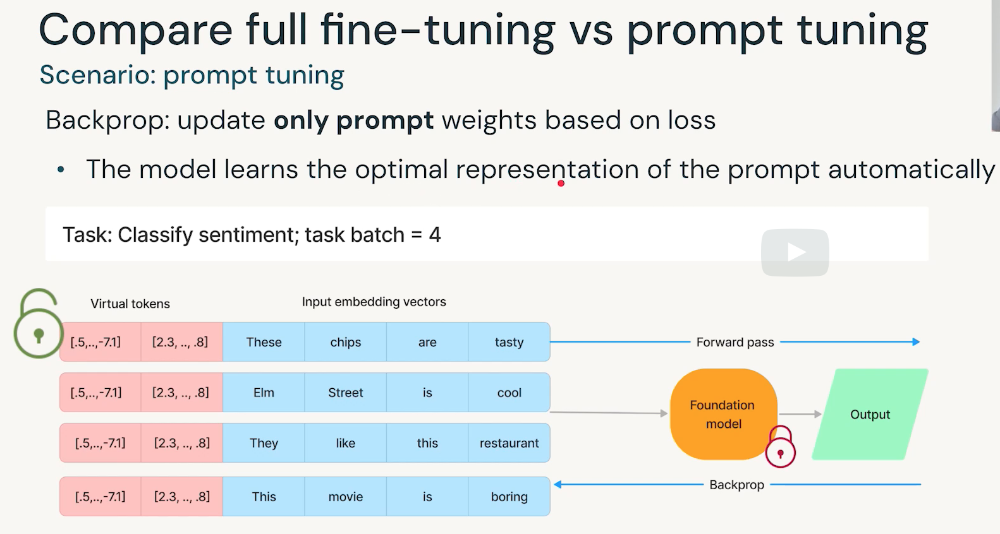


*So far, our example only includes a single example of task: sentiment classification. But what if we have multiple tasks including Q/A, translation, etc.?*

That's not a problem, we can treat each task as a prompt. For each prompt,
we would specify that for each task. So for each task, there will be a different soft
prompt altogether, so that way at deployment time, we don't need to swap in and out the base model or
the foundation model. What we need to do is to only swap in and out the learned virtual tokens.

The other benefit is that the model can now process a single larger mixed task batch.
A task batch consist of multiple requests, it not only has sentiment classification but it can also take in a Q/A requests or translation requests.
The variety of tasks that is captured in a batch is what we call as a mixed task batch.

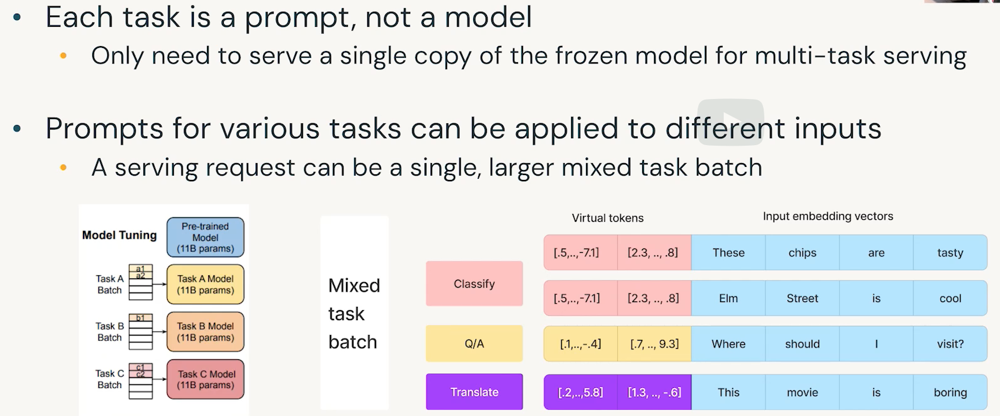



What researchers have found is that **for larger models, especially at more than 11 billion scale parameter, prompt tuning matches the performance of full fine-tuning**. We can see that *soft prompt tuning doesn't perform as well when a model is small, which intuitively makes sense because smaller models have smaller capacities to learn*. But when the model gets larger, then we can see that, with full fine-tuning versus prompt tuning, we can see the performance actually is very similar. 

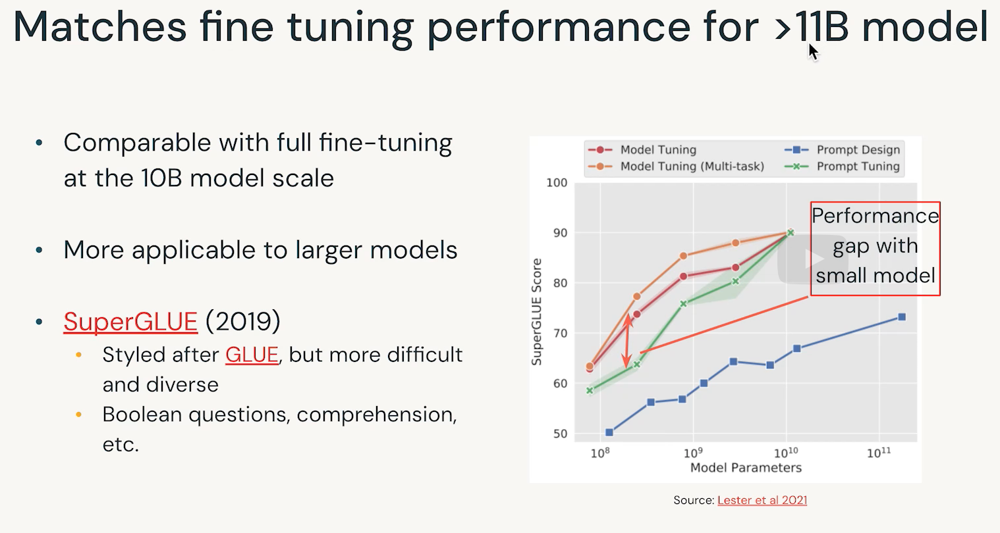


So what is prompt length?

We can see in this example, when we initialize our virtual prompts,
there are only two embedding vectors over here. So this is a prompt length of two.
Larger models do well even when the prompt length is one. And in fact, there seems to be
diminishing return, diminishing return in model performance as we increase the prompt length.
A prompt length of 100, which is the green one over here, seems to be the sweet spot
but also notice that the confidence bar for the scores for the SuperGLUE score is
also quite wide. So, **soft prompt tuning has the problem of unstable performance**.

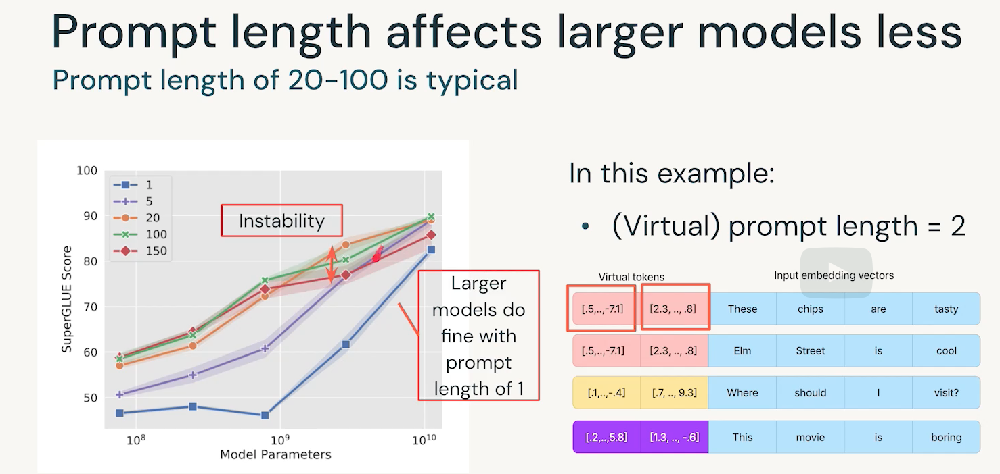


**Advantanges of Soft Prompt Tuning**

The advantages of prompt tuning. Unlike few-shot learning, where we have to do
manual prompt engineering, we are not limited by the number of examples that we can pass to
the model context. We also eliminate the challenge of crafting the best prompt manually. We can use
backprop to ask the model to help us find the best embedding representation of the
task-specific virtual prompts. 

We don't need to have multiple copies of the same model.
We can afford to have multitask serving and lastly, it is also resilient to domain shift.
What this refers to is, **since we freeze or we lock the foundation model weights,
prompt tuning prevents the model from modifying its general understanding of language. Therefore,
it reduces the model's ability to overfit on your fine-tuned data set**.
By comparison, **our learned soft prompts also have a much smaller number of parameters,
so they can be more generalizable to the variations of the tasks at inference time**.

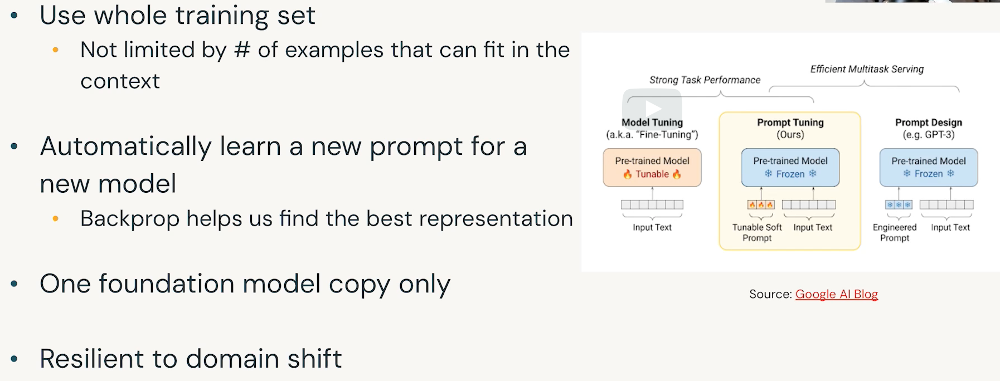


**Disadvantanges of Soft Prompt Tuning**

Prompt tuning has some disadvantages. You'll probably have been
wondering the whole time or even in the beginning too, you know, how do you know what these virtual
tokens are? The answer is we don't really. *The best attempt interpreting them is to use some
cosine distance or some distance metric to find out nearest neighbors so we can estimate* or guess
what words they might represent. So it is much less interpretable compared to discrete prompt.
The second disadvantage, as we saw just now, is prompt tuning can have unstable performance.

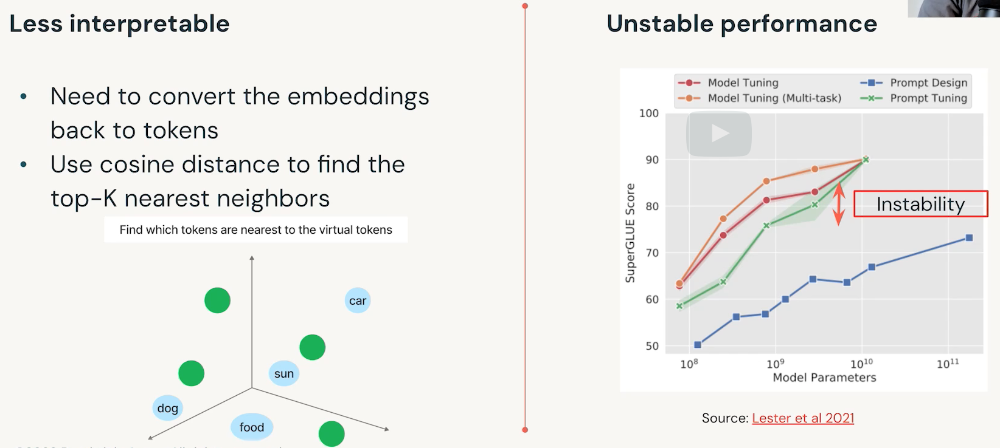

> **Re-Parametrization: LoRA**

One of the most popular techniques today in PEFT, which is LoRA. **LoRA is our re-parameterization method, which means it leverages low-rank representation to minimize the number of trainable parameters**.

In fine-tuning or any general model training scenario, we update the model weights as we go through forward and also backward pass. The idea behind LoRA is that we can decompose the weight_delta matrix into two low-rank matrices.

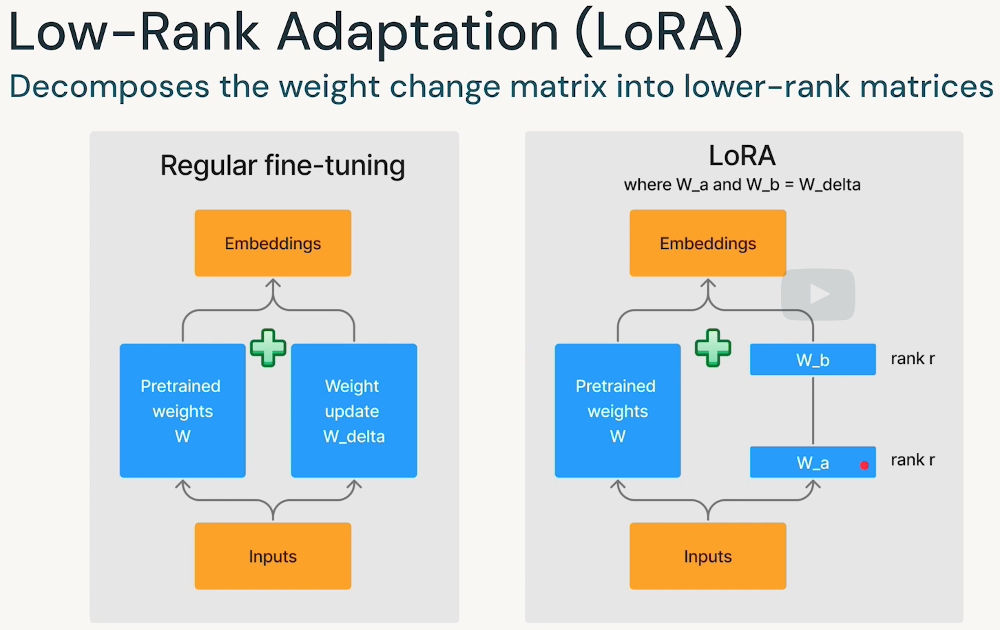


Let's briefly revisit linear algebra basics to understand what matrix rank is.

"*Rank refers to the maximum number of linearly independent columns in a matrix.
When you have a full-rank matrix, it means that the matrix doesn't have any redundant
rows or columns that can be expressed based on other combinations of columns*".

So essentially, we're trying to make sure that we represent information in a matrix without any redundancy.


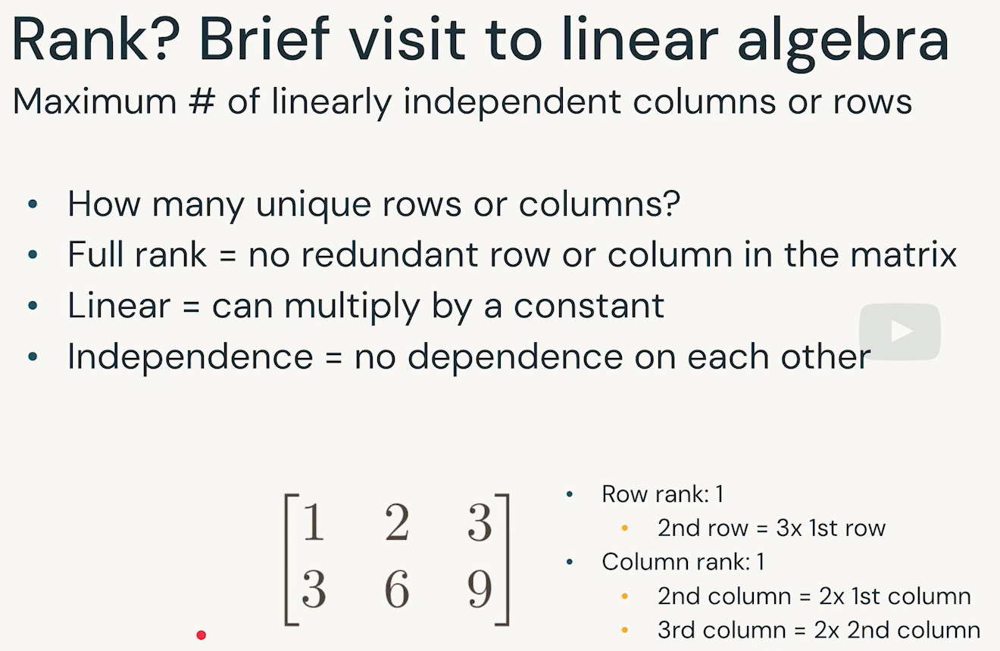

**How does this helps reduce the number of trainable parameters**

But how does this reduce the number of trainable parameters? Let's take a look at a dummy example.
W_delta has dimension of 100 x 100. We can decompose that to two smaller matrices, W_a with
100 x 2 dimension and W_b with a dimension of 2 x 100. When we multiply these two matrices together,
they still give us the same shape as (100x100) which is the same shape as W_delta. And this
is really important because we can now then concatenate the results of these matrices with the
original pre-trained weights and pass that to the subsequent layer. And this decomposition method
dramatically reduces the number of parameters.

So the total number of parameters that we see over here is (100x2) + (2x100), which is 400.
But if I were to get the number of parameters from this original W_delta matrix, then we have 10,000
parameters altogether. So this brings us to a 96% of reduction in number of trainable parameters.

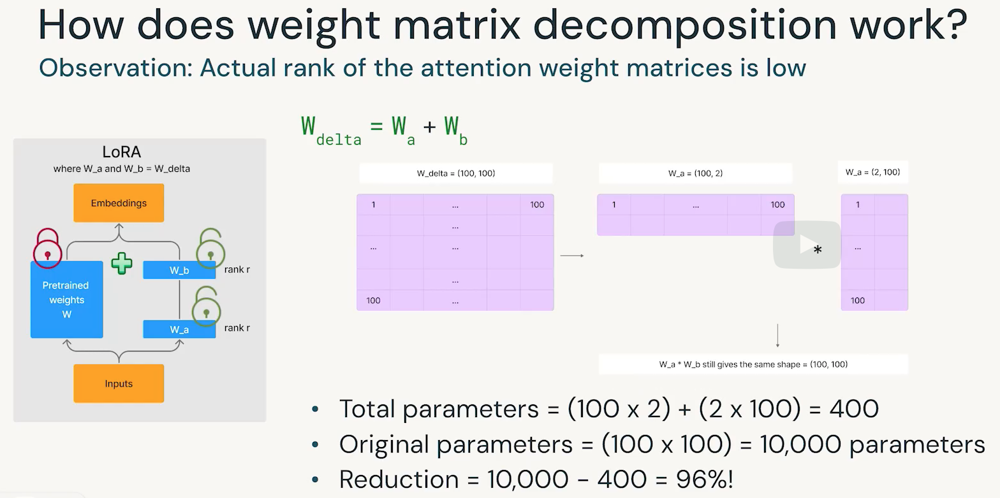


The next natural question to ask is how do we determine the rank of these matrices?
We can treat that as a hyperparameter to search over. Generally, rank sizes
produce roughly similar validation accuracies, at least for GPT-3. Intuitively speaking though,
small r likely won't work for all tasks or data sets because in cases where the downstream tasks
are much more different than the original tasks that the base model is trained on.
But the researchers have also played with updating different combinations of weight
matrices for decomposition but there were no clear trends to take away from.

**Advantages of LoRA Model**

LoRA, just like prompt tuning, locks up or freezes the majority
of the model weights. You can share or reuse the same foundation model. You can improve
training efficiency since you don't have to compute most gradients or optimizer states.
It also adds no additional serving latency because we can merge W_a and also W_b literally.
We can also combine it with other PEFT methods as well. However, the existing PEFT library
from Hugging Face doesn't allow a combination of PEFT methods to be concurrently used yet.

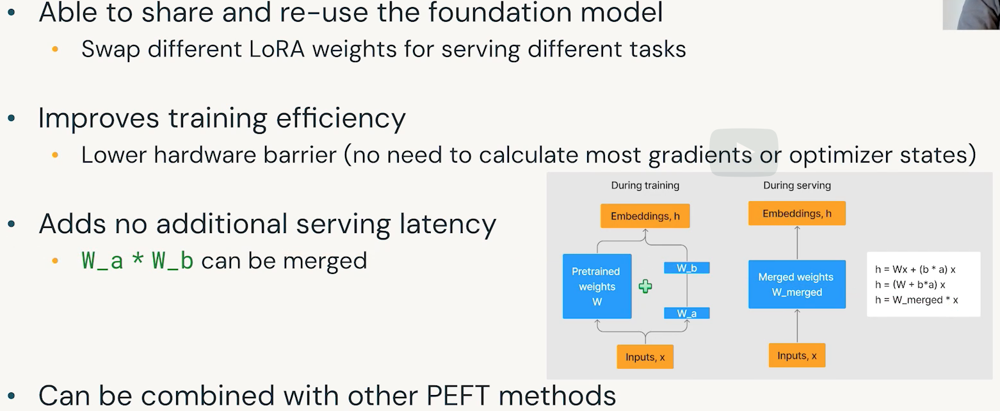


**Disadvantages of LoRA Models**

Even though we could theoretically just swap different weight update matrices at serving time,
it is not really straightforward on how to do so using when we have a single mixed task batch.
If we want to dynamically choose which combos of weight matrices A and B at serving time,
then there's additional serving latency. But there are also, of course, other open
research questions as well, such as, why do we only decompose W_delta? Can we decompose other
matrices like the original weight matrix or can we reduce the number of parameters even more?
And in fact, there is already a newer PEFT technique called IA3
that improves upon LoRA that can reduce even more number of trainable parameters.

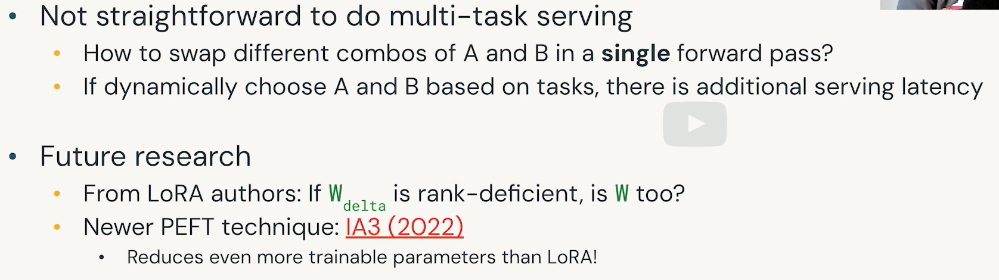

> **PEFT Limitations**

As promising prompt tuning or LoRA sounds, PEFT, in general,
it's not perfect. Regardless of the PEFT technique that you use, they share a lot
of common limitations.

- So let's first look at it from the angle of model performance. Even though in many instances they can match the performance of full fine-tuning, it is really hard to have stable performance that can outperform full fine-tuning all the time because PEFT can be very sensitive to hyperparameter changes. It is also not very clear why we choose to use PEFT where we use them currently.

- The second angle that we can look at is the compute limitation. It doesn't always make serving or inference more efficient and it doesn't remove the cost or reduce the cost of storing the single copy of massive foundation model. And lastly, we still have to undergo the same time complexity of training because we require full forward and backward passes for PEFT as well.

> **Data Preparation Best Practices**

Data preparation best practices, which is a prerequisite to doing any good fine-tuning, is often the most
challenging part in any ML project. How do we collect data? How do we prepare the data well? (better models come from better training data).
Many high-performing LLMs that we hear a lot about these days involve a lot of intentionally
curated data. 

For example, the MPT series and the Llama series both use an improved version
of the Common Crawl data set called C4. C4 stands for Colossal Clean Crawled Corpus.
You can click on the link on this slide to learn more about C4. GPT-Neo and GPT-J,
which are the open-source alternatives to GPT-3, are trained on a data set called The Pile,
which consists of 22 diverse and high-quality data sets. GPT-J is on par with GPT-3 for zero-shot
use cases and GPT Neo is better than the Ada variant of GPT-3 for sentiment classification.

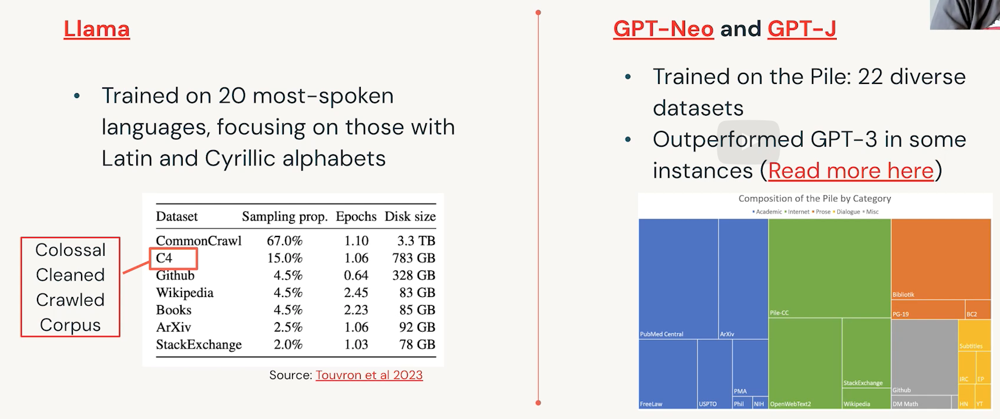


**How Much Fine-Tuning Data Do I Need?**

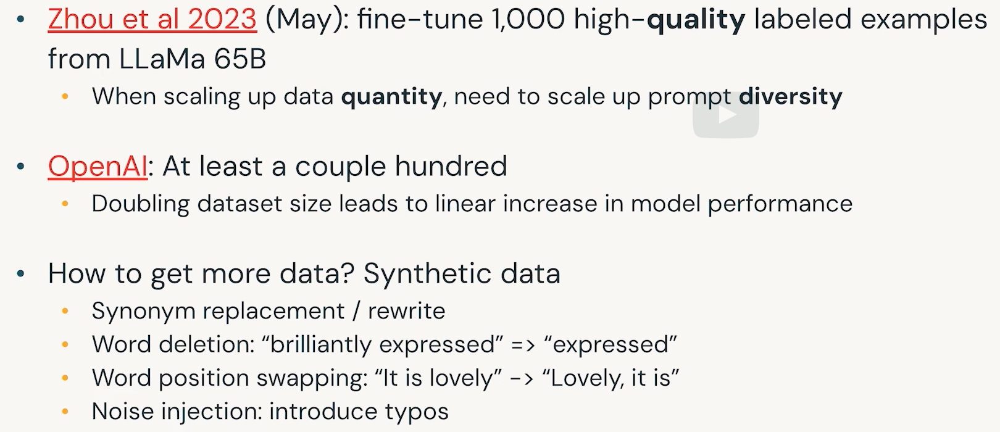


**Data Preparation Best Practices**

Preparing data is definitely a non-trivial task. We need to **manually verify data quality,
remove any undesired data, including offensive and toxic content or any private or confidential
information**. 

Lastly, I want to call out that using LLM output as the data is not always the answer
because these downstream models or imitation models tend to learn style, rather than the
content that you pass into the model, where knowledge of a model is largely learned during pre-training.
So **if you want to fine-tune your model, make sure to pick a foundation model that's trained on tasks or data sets more similar to your downstream tasks**.

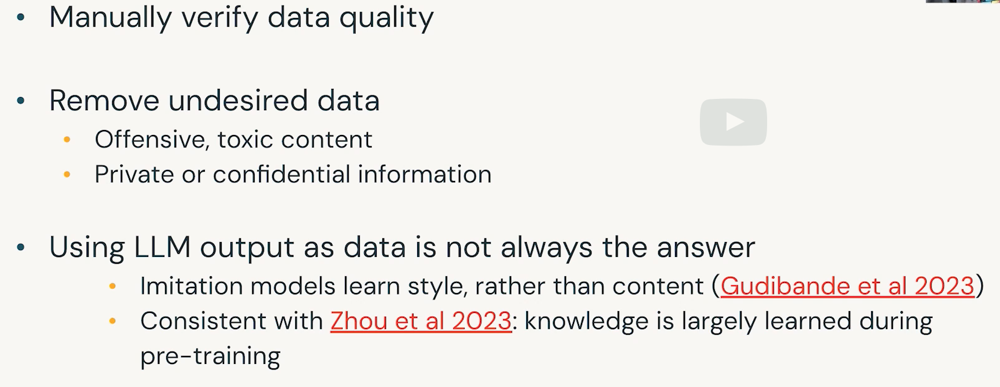

> **Module Summary**

We talked about how fine-tuning often gives the best results but can be computationally prohibitive. If that's not an option for you,
then that's where we explore parameter-efficient fine-tuning because it can reduce the number of
trainable parameters by a lot. One of the methods that we looked into is called prompt tuning,
which falls under soft prompt or the additive category. It can allow virtual prompts to be
learned, automatically removing the need for manual prompt engineering. The second method
that we looked into is called LoRA, which is a re-parameterization method that can decompose
the weight_delta matrix into lower-rank matrices. Lastly, fine-tuning data quality and diversity
matters a lot. If you have more data, then that can improve your model performance.

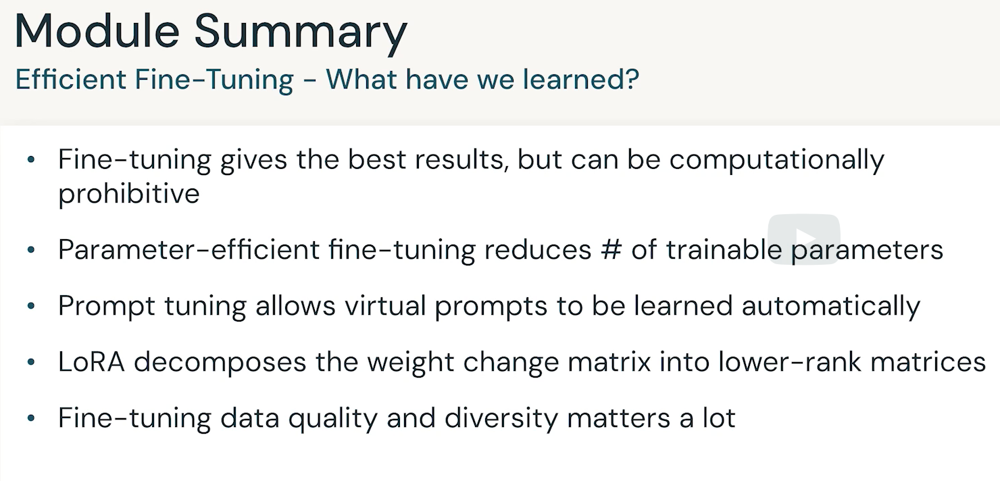